# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [1]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [2]:
!mkdir data

mkdir: cannot create directory ‘data’: File exists


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [3]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Testing Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

SVHN Training Set: 182MB [00:03, 59.2MB/s]                            
SVHN Testing Set: 64.3MB [00:01, 50.0MB/s]                            


These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [4]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

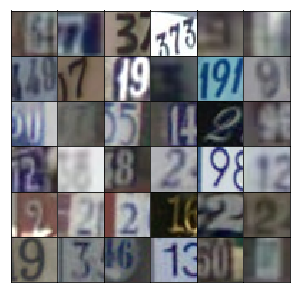

In [5]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [6]:
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [7]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(dataset.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

## Network Inputs

Here, just creating some placeholders like normal.

In [8]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3. 

>**Exercise:** Build the transposed convolutional network for the generator in the function below. Be sure to use leaky ReLUs on all the layers except for the last tanh layer, as well as batch normalization on all the transposed convolutional layers except the last one.

In [9]:
def generator(z, output_dim, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        x1 = tf.layers.dense(z, 4*4*512)
        # Convolutional stack 
        x1 = tf.reshape(x1, (-1, 4, 4, 512))
        x1 = tf.layers.batch_normalization(x1, training=training)
        x1 = tf.maximum(x1, alpha*x1)
        # 4x4x512
        
        # first convolutional layer
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=training)
        x2 = tf.maximum(x2, alpha*x2)
        # 8x8x256
        
        # second convolutional layer
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=training)
        x3 = tf.maximum(x3, alpha*x3)
        # 16x16x128
        
        # Output layer, third convolutional
        logits = tf.layers.conv2d_transpose(x3, output_dim, 5, strides=2, padding='same')        
        # 32x32x3
        
        out = tf.tanh(logits)
        
        return out

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've built before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU.

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

>**Exercise:** Build the convolutional network for the discriminator. The input is a 32x32x3 images, the output is a sigmoid plus the logits. Again, use Leaky ReLU activations and batch normalization on all the layers except the first.

In [10]:
def discriminator(x, reuse=False, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        x1 = tf.layers.conv2d(x, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(x1, alpha*x1)
        # 16x16x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(bn2, alpha*bn2)
        # 8x8x128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(bn3, alpha*bn3)
        # 4x4x256
        
        # Flattening
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits

## Model Loss

Calculating the loss like before, nothing new here.

In [11]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, output_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [12]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [13]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                              real_size[2], alpha=alpha)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, beta1)

Here is a function for displaying generated images.

In [14]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an error without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [15]:
def train(net, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_size))

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))

                # Run optimizers
                _ = sess.run(net.d_opt, feed_dict={net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.input_real: x})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    gen_samples = sess.run(
                                   generator(net.input_z, 3, reuse=True, training=False),
                                   feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very sensitive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

>**Exercise:** Find hyperparameters to train this GAN. The values found in the DCGAN paper work well, or you can experiment on your own. In general, you want the discriminator loss to be around 0.3, this means it is correctly classifying images as fake or real about 50% of the time.

In [16]:
real_size = (32,32,3)
z_size = 100
learning_rate = 0.0002  # 0.0002 suggested, original 0.001
batch_size = 64
epochs = 5         # 5 epochs suggested, original 1
alpha = 0.2        # 0.2 suggested (as in defaults), original 0.01
beta1 = 0.5        # 0.5 suggested, original 0.9

# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

Epoch 1/5... Discriminator Loss: 1.2367... Generator Loss: 0.7333
Epoch 1/5... Discriminator Loss: 0.2188... Generator Loss: 3.9076
Epoch 1/5... Discriminator Loss: 0.8718... Generator Loss: 0.7599
Epoch 1/5... Discriminator Loss: 0.3581... Generator Loss: 1.4153
Epoch 1/5... Discriminator Loss: 0.1405... Generator Loss: 2.6451
Epoch 1/5... Discriminator Loss: 0.1813... Generator Loss: 2.3285
Epoch 1/5... Discriminator Loss: 0.0665... Generator Loss: 3.5141
Epoch 1/5... Discriminator Loss: 0.1148... Generator Loss: 3.1591
Epoch 1/5... Discriminator Loss: 0.1920... Generator Loss: 3.0061
Epoch 1/5... Discriminator Loss: 0.1202... Generator Loss: 3.0772


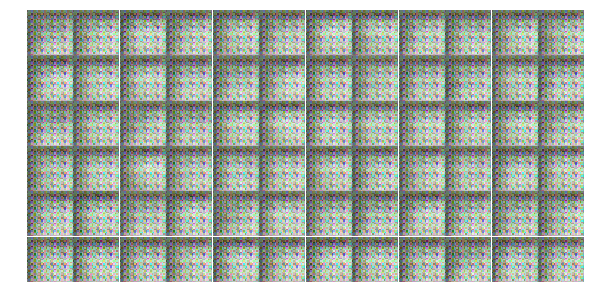

Epoch 1/5... Discriminator Loss: 0.2719... Generator Loss: 2.1930
Epoch 1/5... Discriminator Loss: 0.3253... Generator Loss: 2.6889
Epoch 1/5... Discriminator Loss: 0.9326... Generator Loss: 1.4457
Epoch 1/5... Discriminator Loss: 0.9546... Generator Loss: 1.0758
Epoch 1/5... Discriminator Loss: 0.4194... Generator Loss: 1.6860
Epoch 1/5... Discriminator Loss: 0.6604... Generator Loss: 1.2612
Epoch 1/5... Discriminator Loss: 0.8210... Generator Loss: 6.2534
Epoch 1/5... Discriminator Loss: 0.2997... Generator Loss: 2.6957
Epoch 1/5... Discriminator Loss: 0.1890... Generator Loss: 3.2188
Epoch 1/5... Discriminator Loss: 0.1707... Generator Loss: 3.5670


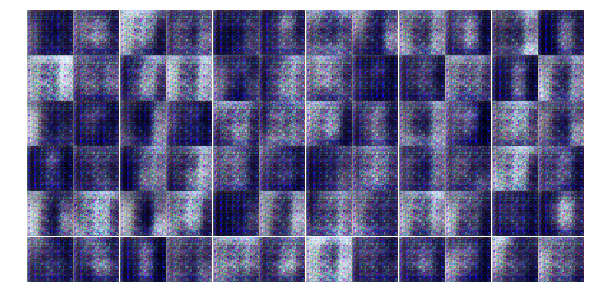

Epoch 1/5... Discriminator Loss: 2.3348... Generator Loss: 1.1848
Epoch 1/5... Discriminator Loss: 0.7798... Generator Loss: 1.2193
Epoch 1/5... Discriminator Loss: 0.3812... Generator Loss: 2.4624
Epoch 1/5... Discriminator Loss: 0.2326... Generator Loss: 3.0234
Epoch 1/5... Discriminator Loss: 0.3450... Generator Loss: 2.3322
Epoch 1/5... Discriminator Loss: 0.4078... Generator Loss: 2.6406
Epoch 1/5... Discriminator Loss: 1.0834... Generator Loss: 0.6435
Epoch 1/5... Discriminator Loss: 0.1825... Generator Loss: 2.7559
Epoch 1/5... Discriminator Loss: 0.3260... Generator Loss: 2.8432
Epoch 1/5... Discriminator Loss: 0.5778... Generator Loss: 1.3658


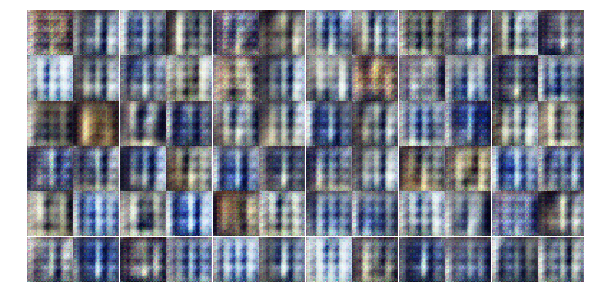

Epoch 1/5... Discriminator Loss: 1.3070... Generator Loss: 4.7542
Epoch 1/5... Discriminator Loss: 1.0726... Generator Loss: 0.7209
Epoch 1/5... Discriminator Loss: 0.9191... Generator Loss: 0.7624
Epoch 1/5... Discriminator Loss: 0.3800... Generator Loss: 2.9993
Epoch 1/5... Discriminator Loss: 0.4349... Generator Loss: 1.3539
Epoch 1/5... Discriminator Loss: 0.2269... Generator Loss: 2.1799
Epoch 1/5... Discriminator Loss: 0.2503... Generator Loss: 2.8709
Epoch 1/5... Discriminator Loss: 0.7741... Generator Loss: 1.1019
Epoch 1/5... Discriminator Loss: 0.3652... Generator Loss: 1.9430
Epoch 1/5... Discriminator Loss: 0.7094... Generator Loss: 2.2312


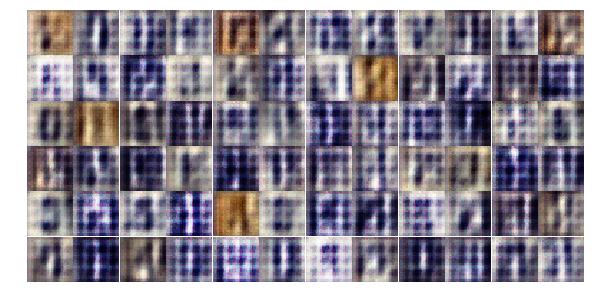

Epoch 1/5... Discriminator Loss: 0.8685... Generator Loss: 0.9452
Epoch 1/5... Discriminator Loss: 0.4843... Generator Loss: 1.5760
Epoch 1/5... Discriminator Loss: 0.3913... Generator Loss: 1.6428
Epoch 1/5... Discriminator Loss: 0.4923... Generator Loss: 1.5352
Epoch 1/5... Discriminator Loss: 0.4153... Generator Loss: 1.5765
Epoch 1/5... Discriminator Loss: 0.6090... Generator Loss: 2.2300
Epoch 1/5... Discriminator Loss: 0.9729... Generator Loss: 1.1069
Epoch 1/5... Discriminator Loss: 1.1085... Generator Loss: 0.7642
Epoch 1/5... Discriminator Loss: 0.9537... Generator Loss: 1.5722
Epoch 1/5... Discriminator Loss: 0.8823... Generator Loss: 1.0202


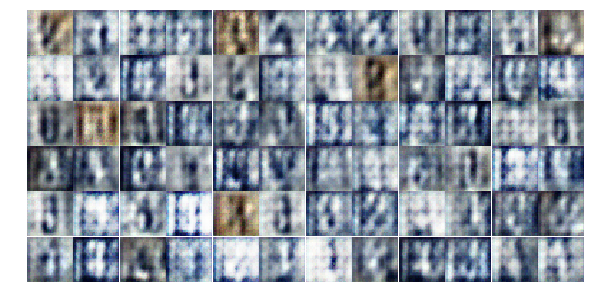

Epoch 1/5... Discriminator Loss: 0.6419... Generator Loss: 1.3779
Epoch 1/5... Discriminator Loss: 0.9353... Generator Loss: 0.8774
Epoch 1/5... Discriminator Loss: 0.7434... Generator Loss: 1.5448
Epoch 1/5... Discriminator Loss: 1.6941... Generator Loss: 0.7132
Epoch 1/5... Discriminator Loss: 0.9589... Generator Loss: 1.4443
Epoch 1/5... Discriminator Loss: 0.8476... Generator Loss: 0.9906
Epoch 1/5... Discriminator Loss: 0.7319... Generator Loss: 1.5457
Epoch 1/5... Discriminator Loss: 0.6703... Generator Loss: 1.4881
Epoch 1/5... Discriminator Loss: 0.7101... Generator Loss: 1.2391
Epoch 1/5... Discriminator Loss: 0.8562... Generator Loss: 1.2283


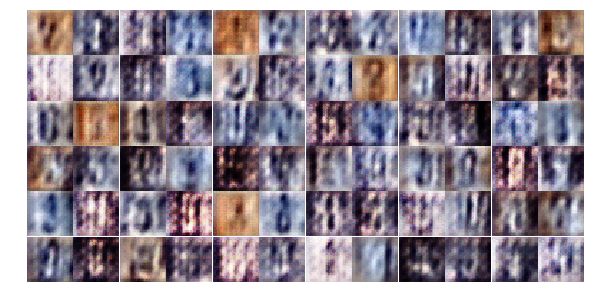

Epoch 1/5... Discriminator Loss: 0.7559... Generator Loss: 1.2646
Epoch 1/5... Discriminator Loss: 0.8516... Generator Loss: 1.1644
Epoch 1/5... Discriminator Loss: 0.8309... Generator Loss: 1.0817
Epoch 1/5... Discriminator Loss: 0.8300... Generator Loss: 0.9504
Epoch 1/5... Discriminator Loss: 0.6885... Generator Loss: 1.4417
Epoch 1/5... Discriminator Loss: 1.2475... Generator Loss: 0.5415
Epoch 1/5... Discriminator Loss: 0.9111... Generator Loss: 1.0839
Epoch 1/5... Discriminator Loss: 1.0208... Generator Loss: 1.0024
Epoch 1/5... Discriminator Loss: 1.0054... Generator Loss: 1.1367
Epoch 1/5... Discriminator Loss: 0.8940... Generator Loss: 1.0072


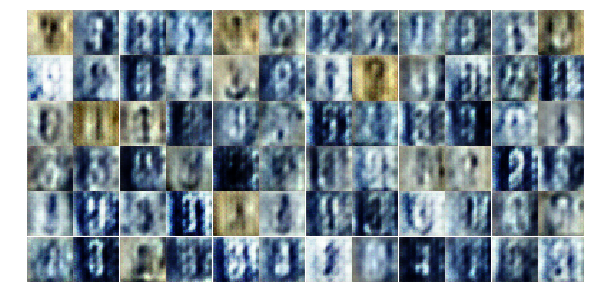

Epoch 1/5... Discriminator Loss: 1.3110... Generator Loss: 0.6513
Epoch 1/5... Discriminator Loss: 0.9843... Generator Loss: 1.1637
Epoch 1/5... Discriminator Loss: 1.2592... Generator Loss: 0.5971
Epoch 1/5... Discriminator Loss: 0.7955... Generator Loss: 1.4380
Epoch 1/5... Discriminator Loss: 1.5768... Generator Loss: 0.5182
Epoch 1/5... Discriminator Loss: 1.3564... Generator Loss: 0.7063
Epoch 1/5... Discriminator Loss: 0.6978... Generator Loss: 1.4244
Epoch 1/5... Discriminator Loss: 0.9670... Generator Loss: 1.1911
Epoch 1/5... Discriminator Loss: 1.1651... Generator Loss: 0.9891
Epoch 1/5... Discriminator Loss: 0.8718... Generator Loss: 1.1223


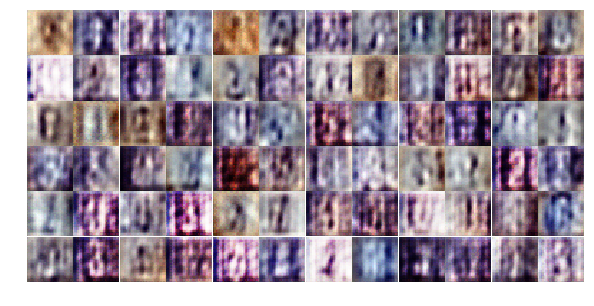

Epoch 1/5... Discriminator Loss: 1.0254... Generator Loss: 1.0020
Epoch 1/5... Discriminator Loss: 0.8958... Generator Loss: 1.1194
Epoch 1/5... Discriminator Loss: 0.7595... Generator Loss: 1.1697
Epoch 1/5... Discriminator Loss: 1.3867... Generator Loss: 0.6402
Epoch 1/5... Discriminator Loss: 1.0818... Generator Loss: 0.9851
Epoch 1/5... Discriminator Loss: 0.8932... Generator Loss: 0.9934
Epoch 1/5... Discriminator Loss: 1.1778... Generator Loss: 0.7927
Epoch 1/5... Discriminator Loss: 1.1583... Generator Loss: 0.8961
Epoch 1/5... Discriminator Loss: 0.8535... Generator Loss: 1.0225
Epoch 1/5... Discriminator Loss: 1.0145... Generator Loss: 1.2213


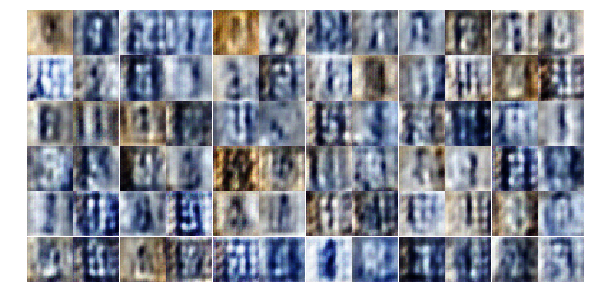

Epoch 1/5... Discriminator Loss: 1.0986... Generator Loss: 0.9510
Epoch 1/5... Discriminator Loss: 0.8790... Generator Loss: 1.0274
Epoch 1/5... Discriminator Loss: 1.0501... Generator Loss: 0.9855
Epoch 1/5... Discriminator Loss: 1.2097... Generator Loss: 0.6526
Epoch 1/5... Discriminator Loss: 0.8836... Generator Loss: 1.0712
Epoch 1/5... Discriminator Loss: 1.0273... Generator Loss: 1.0346
Epoch 1/5... Discriminator Loss: 1.0688... Generator Loss: 0.9630
Epoch 1/5... Discriminator Loss: 1.0881... Generator Loss: 0.9891
Epoch 1/5... Discriminator Loss: 0.9440... Generator Loss: 1.1470
Epoch 1/5... Discriminator Loss: 1.4219... Generator Loss: 0.5576


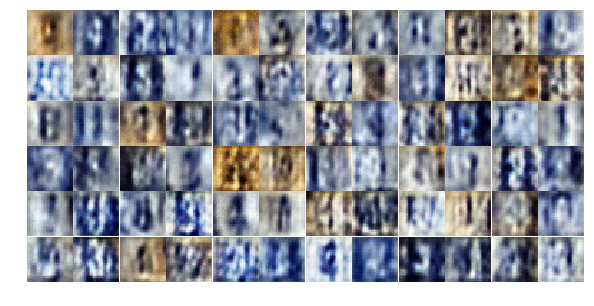

Epoch 1/5... Discriminator Loss: 1.1662... Generator Loss: 0.9834
Epoch 1/5... Discriminator Loss: 1.0342... Generator Loss: 0.9344
Epoch 1/5... Discriminator Loss: 1.3021... Generator Loss: 0.6885
Epoch 1/5... Discriminator Loss: 1.2007... Generator Loss: 0.9453
Epoch 1/5... Discriminator Loss: 1.0647... Generator Loss: 0.7953
Epoch 1/5... Discriminator Loss: 0.7632... Generator Loss: 1.2140
Epoch 1/5... Discriminator Loss: 1.2004... Generator Loss: 0.6207
Epoch 1/5... Discriminator Loss: 1.1570... Generator Loss: 0.7989
Epoch 1/5... Discriminator Loss: 1.0628... Generator Loss: 1.0275
Epoch 1/5... Discriminator Loss: 0.8977... Generator Loss: 1.0973


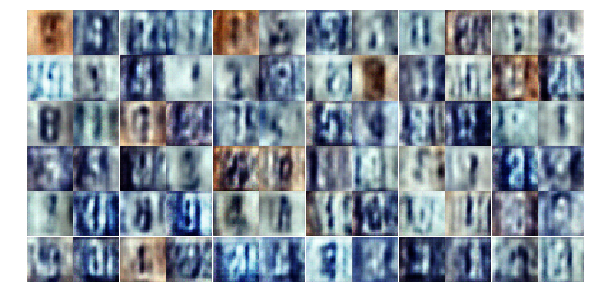

Epoch 1/5... Discriminator Loss: 1.0601... Generator Loss: 0.7629
Epoch 1/5... Discriminator Loss: 0.9428... Generator Loss: 1.2253
Epoch 1/5... Discriminator Loss: 1.3336... Generator Loss: 1.0855
Epoch 1/5... Discriminator Loss: 1.2651... Generator Loss: 0.5959
Epoch 2/5... Discriminator Loss: 1.1078... Generator Loss: 0.8072
Epoch 2/5... Discriminator Loss: 0.9847... Generator Loss: 1.0409
Epoch 2/5... Discriminator Loss: 1.1638... Generator Loss: 0.8621
Epoch 2/5... Discriminator Loss: 1.0594... Generator Loss: 1.0100
Epoch 2/5... Discriminator Loss: 1.4792... Generator Loss: 0.7236
Epoch 2/5... Discriminator Loss: 1.0949... Generator Loss: 0.9532


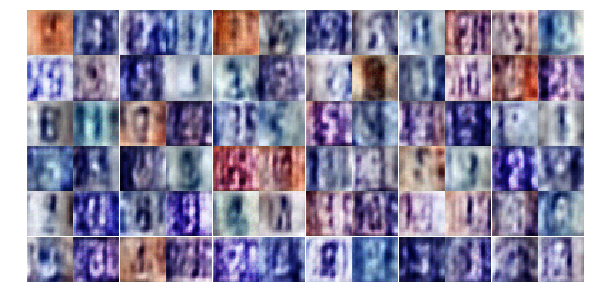

Epoch 2/5... Discriminator Loss: 1.0866... Generator Loss: 1.0382
Epoch 2/5... Discriminator Loss: 1.0842... Generator Loss: 1.0330
Epoch 2/5... Discriminator Loss: 1.0399... Generator Loss: 0.8759
Epoch 2/5... Discriminator Loss: 0.9390... Generator Loss: 0.9800
Epoch 2/5... Discriminator Loss: 0.8914... Generator Loss: 1.0598
Epoch 2/5... Discriminator Loss: 0.8525... Generator Loss: 1.1803
Epoch 2/5... Discriminator Loss: 1.1222... Generator Loss: 0.7780
Epoch 2/5... Discriminator Loss: 1.0832... Generator Loss: 0.7531
Epoch 2/5... Discriminator Loss: 1.1496... Generator Loss: 0.7187
Epoch 2/5... Discriminator Loss: 0.9034... Generator Loss: 1.1313


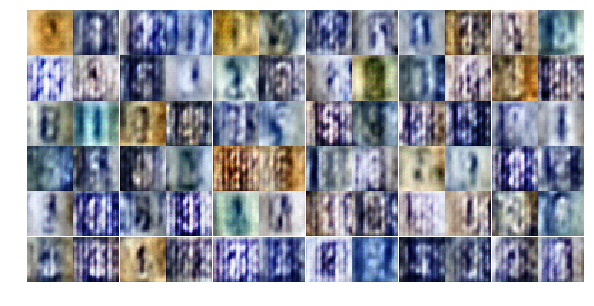

Epoch 2/5... Discriminator Loss: 0.9465... Generator Loss: 0.8944
Epoch 2/5... Discriminator Loss: 1.1538... Generator Loss: 0.7205
Epoch 2/5... Discriminator Loss: 0.9646... Generator Loss: 1.0198
Epoch 2/5... Discriminator Loss: 0.9221... Generator Loss: 0.9017
Epoch 2/5... Discriminator Loss: 1.0075... Generator Loss: 0.8584
Epoch 2/5... Discriminator Loss: 1.3422... Generator Loss: 0.5209
Epoch 2/5... Discriminator Loss: 0.7806... Generator Loss: 1.2474
Epoch 2/5... Discriminator Loss: 0.9930... Generator Loss: 0.6743
Epoch 2/5... Discriminator Loss: 0.8130... Generator Loss: 1.1072
Epoch 2/5... Discriminator Loss: 1.2518... Generator Loss: 0.8379


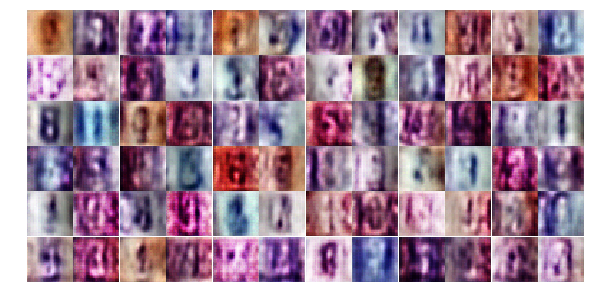

Epoch 2/5... Discriminator Loss: 1.5010... Generator Loss: 0.5102
Epoch 2/5... Discriminator Loss: 0.6247... Generator Loss: 1.5044
Epoch 2/5... Discriminator Loss: 0.9323... Generator Loss: 1.7745
Epoch 2/5... Discriminator Loss: 0.8977... Generator Loss: 1.2373
Epoch 2/5... Discriminator Loss: 0.5722... Generator Loss: 1.7194
Epoch 2/5... Discriminator Loss: 1.1165... Generator Loss: 1.1907
Epoch 2/5... Discriminator Loss: 0.9507... Generator Loss: 0.9444
Epoch 2/5... Discriminator Loss: 0.5320... Generator Loss: 1.4328
Epoch 2/5... Discriminator Loss: 0.5068... Generator Loss: 2.1182
Epoch 2/5... Discriminator Loss: 1.1608... Generator Loss: 0.6041


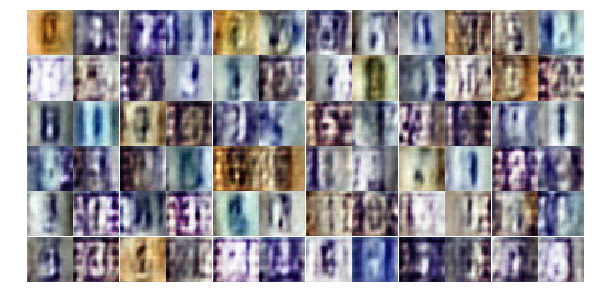

Epoch 2/5... Discriminator Loss: 0.6062... Generator Loss: 1.3441
Epoch 2/5... Discriminator Loss: 0.9416... Generator Loss: 0.7928
Epoch 2/5... Discriminator Loss: 1.2938... Generator Loss: 0.4457
Epoch 2/5... Discriminator Loss: 0.8195... Generator Loss: 1.1453
Epoch 2/5... Discriminator Loss: 0.6780... Generator Loss: 2.3799
Epoch 2/5... Discriminator Loss: 0.7777... Generator Loss: 2.0160
Epoch 2/5... Discriminator Loss: 0.7900... Generator Loss: 1.5971
Epoch 2/5... Discriminator Loss: 0.5708... Generator Loss: 1.4515
Epoch 2/5... Discriminator Loss: 1.2830... Generator Loss: 0.4837
Epoch 2/5... Discriminator Loss: 0.7582... Generator Loss: 1.0763


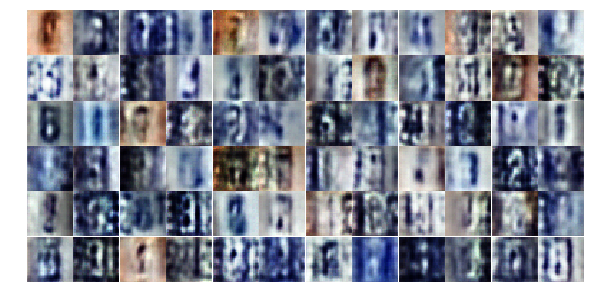

Epoch 2/5... Discriminator Loss: 0.8388... Generator Loss: 0.8789
Epoch 2/5... Discriminator Loss: 0.7251... Generator Loss: 2.2055
Epoch 2/5... Discriminator Loss: 0.8584... Generator Loss: 0.8793
Epoch 2/5... Discriminator Loss: 0.5188... Generator Loss: 1.9784
Epoch 2/5... Discriminator Loss: 0.3635... Generator Loss: 1.7497
Epoch 2/5... Discriminator Loss: 0.9423... Generator Loss: 0.6418
Epoch 2/5... Discriminator Loss: 0.5770... Generator Loss: 1.1257
Epoch 2/5... Discriminator Loss: 0.4825... Generator Loss: 1.5835
Epoch 2/5... Discriminator Loss: 0.9072... Generator Loss: 1.3208
Epoch 2/5... Discriminator Loss: 0.7078... Generator Loss: 1.0543


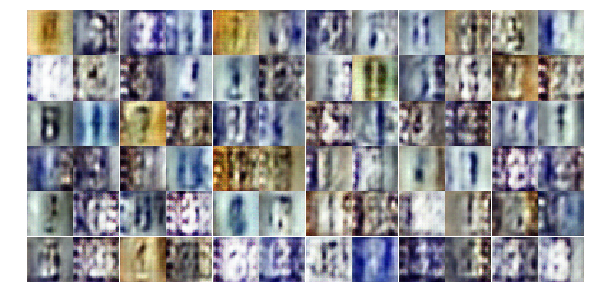

Epoch 2/5... Discriminator Loss: 0.4818... Generator Loss: 1.7238
Epoch 2/5... Discriminator Loss: 1.1697... Generator Loss: 0.5322
Epoch 2/5... Discriminator Loss: 0.7059... Generator Loss: 0.9016
Epoch 2/5... Discriminator Loss: 0.4527... Generator Loss: 1.7076
Epoch 2/5... Discriminator Loss: 0.5629... Generator Loss: 1.3596
Epoch 2/5... Discriminator Loss: 0.3454... Generator Loss: 2.6569
Epoch 2/5... Discriminator Loss: 0.3912... Generator Loss: 1.7729
Epoch 2/5... Discriminator Loss: 0.6356... Generator Loss: 1.1197
Epoch 2/5... Discriminator Loss: 0.6669... Generator Loss: 1.0513
Epoch 2/5... Discriminator Loss: 0.4798... Generator Loss: 1.7466


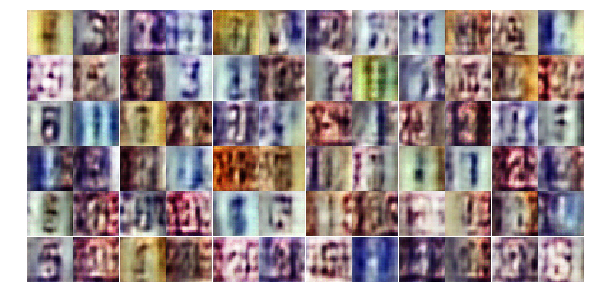

Epoch 2/5... Discriminator Loss: 1.5095... Generator Loss: 0.3497
Epoch 2/5... Discriminator Loss: 0.3111... Generator Loss: 2.0848
Epoch 2/5... Discriminator Loss: 0.6721... Generator Loss: 1.0271
Epoch 2/5... Discriminator Loss: 0.9019... Generator Loss: 1.0252
Epoch 2/5... Discriminator Loss: 1.1779... Generator Loss: 3.8963
Epoch 2/5... Discriminator Loss: 0.8428... Generator Loss: 1.4762
Epoch 2/5... Discriminator Loss: 0.7053... Generator Loss: 1.8171
Epoch 2/5... Discriminator Loss: 0.9144... Generator Loss: 0.9767
Epoch 2/5... Discriminator Loss: 0.7626... Generator Loss: 1.4710
Epoch 2/5... Discriminator Loss: 0.5283... Generator Loss: 1.7238


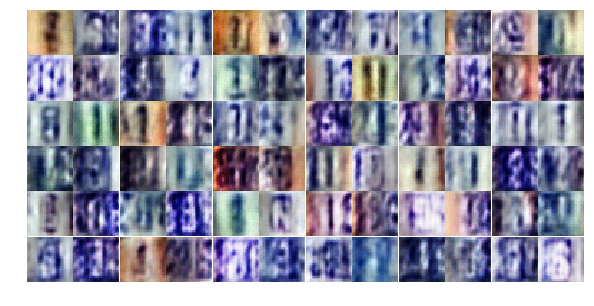

Epoch 2/5... Discriminator Loss: 0.5946... Generator Loss: 1.7743
Epoch 2/5... Discriminator Loss: 1.0390... Generator Loss: 0.6055
Epoch 2/5... Discriminator Loss: 0.4494... Generator Loss: 2.2007
Epoch 2/5... Discriminator Loss: 0.4317... Generator Loss: 2.0153
Epoch 2/5... Discriminator Loss: 0.4338... Generator Loss: 1.4821
Epoch 2/5... Discriminator Loss: 0.7291... Generator Loss: 1.0217
Epoch 2/5... Discriminator Loss: 0.6299... Generator Loss: 1.2672
Epoch 2/5... Discriminator Loss: 0.6181... Generator Loss: 1.0541
Epoch 2/5... Discriminator Loss: 0.6608... Generator Loss: 1.0871
Epoch 2/5... Discriminator Loss: 0.4858... Generator Loss: 1.1731


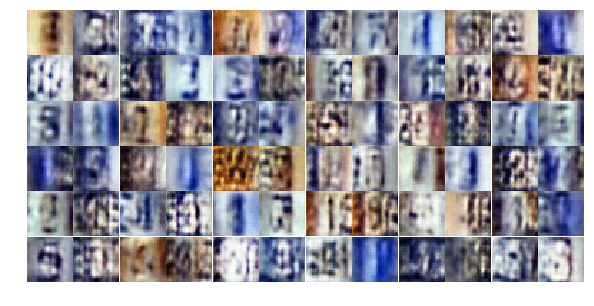

Epoch 2/5... Discriminator Loss: 0.3645... Generator Loss: 1.7651
Epoch 2/5... Discriminator Loss: 1.1763... Generator Loss: 0.5193
Epoch 2/5... Discriminator Loss: 1.2286... Generator Loss: 0.7028
Epoch 2/5... Discriminator Loss: 0.6070... Generator Loss: 1.5948
Epoch 2/5... Discriminator Loss: 0.9238... Generator Loss: 0.6992
Epoch 2/5... Discriminator Loss: 1.4923... Generator Loss: 0.3578
Epoch 2/5... Discriminator Loss: 1.0136... Generator Loss: 0.6928
Epoch 2/5... Discriminator Loss: 1.1064... Generator Loss: 0.5870
Epoch 2/5... Discriminator Loss: 0.8577... Generator Loss: 0.7579
Epoch 2/5... Discriminator Loss: 0.9168... Generator Loss: 0.7738


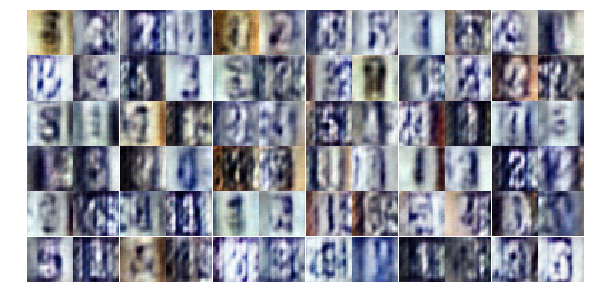

Epoch 2/5... Discriminator Loss: 0.7433... Generator Loss: 0.9885
Epoch 2/5... Discriminator Loss: 0.6723... Generator Loss: 1.0849
Epoch 2/5... Discriminator Loss: 0.6240... Generator Loss: 2.1366
Epoch 2/5... Discriminator Loss: 0.4687... Generator Loss: 2.0397
Epoch 2/5... Discriminator Loss: 1.6602... Generator Loss: 0.2771
Epoch 2/5... Discriminator Loss: 1.0012... Generator Loss: 0.7222
Epoch 2/5... Discriminator Loss: 0.6381... Generator Loss: 1.1755
Epoch 2/5... Discriminator Loss: 0.3546... Generator Loss: 1.7440
Epoch 2/5... Discriminator Loss: 1.4311... Generator Loss: 0.3690
Epoch 2/5... Discriminator Loss: 0.5822... Generator Loss: 1.3076


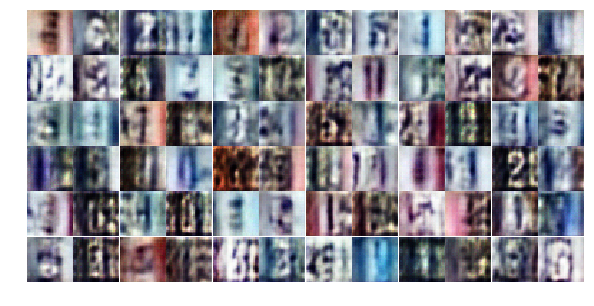

Epoch 2/5... Discriminator Loss: 0.5466... Generator Loss: 1.2830
Epoch 2/5... Discriminator Loss: 0.6466... Generator Loss: 1.2120
Epoch 2/5... Discriminator Loss: 0.2895... Generator Loss: 2.6720
Epoch 2/5... Discriminator Loss: 0.5728... Generator Loss: 1.5892
Epoch 2/5... Discriminator Loss: 1.0119... Generator Loss: 0.6811
Epoch 2/5... Discriminator Loss: 0.5650... Generator Loss: 1.4439
Epoch 2/5... Discriminator Loss: 0.4704... Generator Loss: 1.8452
Epoch 2/5... Discriminator Loss: 0.5227... Generator Loss: 1.2349
Epoch 2/5... Discriminator Loss: 0.5429... Generator Loss: 1.1538
Epoch 3/5... Discriminator Loss: 0.6747... Generator Loss: 1.9536


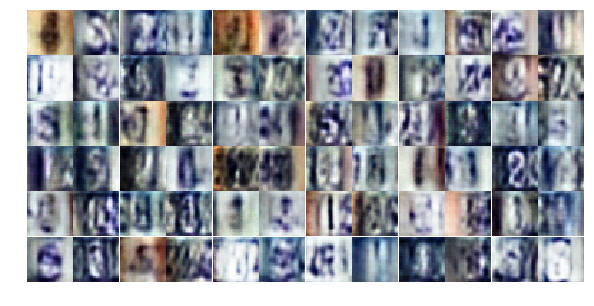

Epoch 3/5... Discriminator Loss: 0.6683... Generator Loss: 1.0015
Epoch 3/5... Discriminator Loss: 0.4812... Generator Loss: 1.7280
Epoch 3/5... Discriminator Loss: 0.2478... Generator Loss: 2.0263
Epoch 3/5... Discriminator Loss: 0.2079... Generator Loss: 2.4244
Epoch 3/5... Discriminator Loss: 0.5358... Generator Loss: 2.2690
Epoch 3/5... Discriminator Loss: 0.4182... Generator Loss: 2.1222
Epoch 3/5... Discriminator Loss: 0.5305... Generator Loss: 1.4336
Epoch 3/5... Discriminator Loss: 0.5563... Generator Loss: 1.3724
Epoch 3/5... Discriminator Loss: 0.8912... Generator Loss: 0.9338
Epoch 3/5... Discriminator Loss: 0.8102... Generator Loss: 0.7760


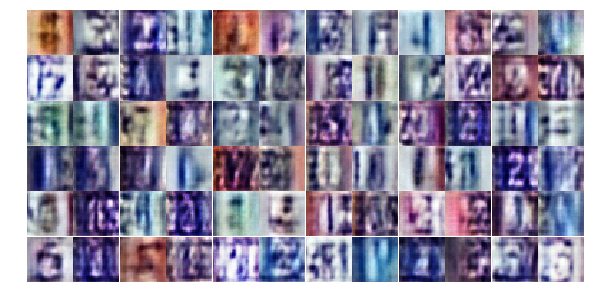

Epoch 3/5... Discriminator Loss: 0.5490... Generator Loss: 2.7337
Epoch 3/5... Discriminator Loss: 1.1035... Generator Loss: 0.5715
Epoch 3/5... Discriminator Loss: 0.4579... Generator Loss: 2.2779
Epoch 3/5... Discriminator Loss: 0.5216... Generator Loss: 1.4589
Epoch 3/5... Discriminator Loss: 0.6854... Generator Loss: 3.2121
Epoch 3/5... Discriminator Loss: 0.4891... Generator Loss: 1.7446
Epoch 3/5... Discriminator Loss: 0.4947... Generator Loss: 1.5723
Epoch 3/5... Discriminator Loss: 0.4806... Generator Loss: 1.4444
Epoch 3/5... Discriminator Loss: 0.3732... Generator Loss: 2.1860
Epoch 3/5... Discriminator Loss: 0.3319... Generator Loss: 1.9319


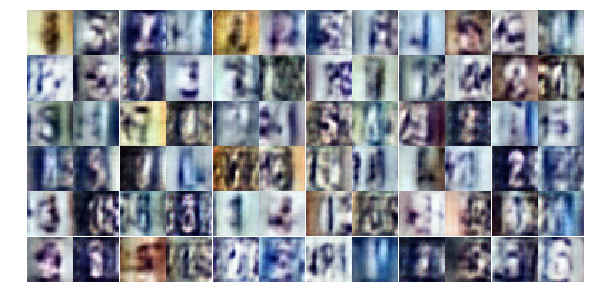

Epoch 3/5... Discriminator Loss: 0.4052... Generator Loss: 1.8935
Epoch 3/5... Discriminator Loss: 0.5551... Generator Loss: 2.6814
Epoch 3/5... Discriminator Loss: 0.5403... Generator Loss: 1.3812
Epoch 3/5... Discriminator Loss: 0.6211... Generator Loss: 1.0937
Epoch 3/5... Discriminator Loss: 1.1994... Generator Loss: 0.5090
Epoch 3/5... Discriminator Loss: 0.4748... Generator Loss: 1.4122
Epoch 3/5... Discriminator Loss: 0.5407... Generator Loss: 1.9867
Epoch 3/5... Discriminator Loss: 1.5684... Generator Loss: 4.0142
Epoch 3/5... Discriminator Loss: 0.5835... Generator Loss: 1.2079
Epoch 3/5... Discriminator Loss: 1.1653... Generator Loss: 0.5871


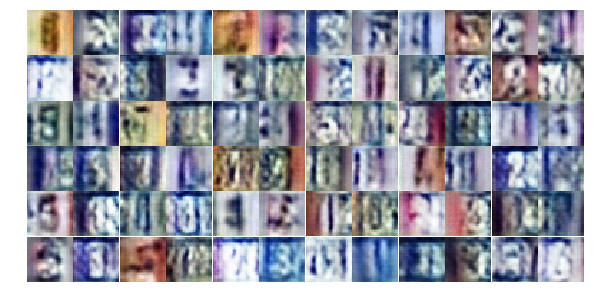

Epoch 3/5... Discriminator Loss: 0.5495... Generator Loss: 1.4263
Epoch 3/5... Discriminator Loss: 0.4812... Generator Loss: 1.5170
Epoch 3/5... Discriminator Loss: 0.4173... Generator Loss: 2.6294
Epoch 3/5... Discriminator Loss: 0.7433... Generator Loss: 0.9077
Epoch 3/5... Discriminator Loss: 0.6814... Generator Loss: 1.1612
Epoch 3/5... Discriminator Loss: 0.5320... Generator Loss: 1.3959
Epoch 3/5... Discriminator Loss: 0.4007... Generator Loss: 1.5554
Epoch 3/5... Discriminator Loss: 0.6563... Generator Loss: 2.7893
Epoch 3/5... Discriminator Loss: 0.3083... Generator Loss: 2.3612
Epoch 3/5... Discriminator Loss: 0.6338... Generator Loss: 1.0031


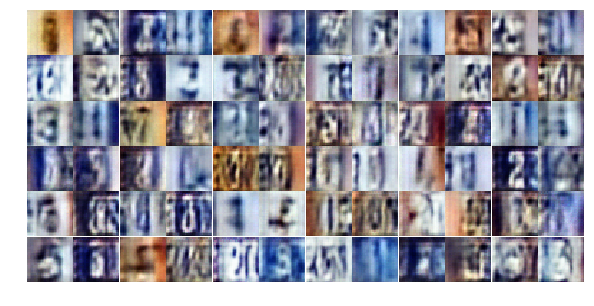

Epoch 3/5... Discriminator Loss: 0.2706... Generator Loss: 1.9501
Epoch 3/5... Discriminator Loss: 0.4223... Generator Loss: 1.5544
Epoch 3/5... Discriminator Loss: 0.6941... Generator Loss: 0.9993
Epoch 3/5... Discriminator Loss: 0.8598... Generator Loss: 0.8621
Epoch 3/5... Discriminator Loss: 0.2332... Generator Loss: 1.9297
Epoch 3/5... Discriminator Loss: 0.5532... Generator Loss: 1.4683
Epoch 3/5... Discriminator Loss: 0.4898... Generator Loss: 1.3523
Epoch 3/5... Discriminator Loss: 1.0824... Generator Loss: 0.6097
Epoch 3/5... Discriminator Loss: 0.4830... Generator Loss: 1.5111
Epoch 3/5... Discriminator Loss: 0.8699... Generator Loss: 0.9763


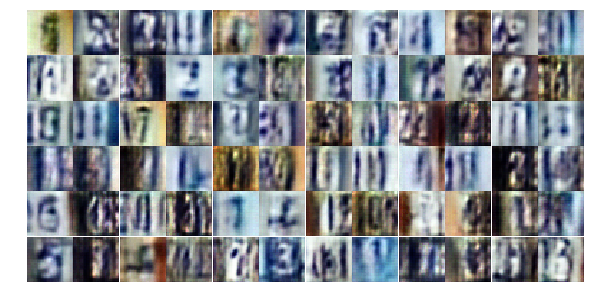

Epoch 3/5... Discriminator Loss: 0.3833... Generator Loss: 2.2616
Epoch 3/5... Discriminator Loss: 1.1858... Generator Loss: 0.5406
Epoch 3/5... Discriminator Loss: 0.4949... Generator Loss: 1.4637
Epoch 3/5... Discriminator Loss: 0.4864... Generator Loss: 1.6348
Epoch 3/5... Discriminator Loss: 0.7086... Generator Loss: 0.9692
Epoch 3/5... Discriminator Loss: 1.2108... Generator Loss: 0.6172
Epoch 3/5... Discriminator Loss: 0.7575... Generator Loss: 0.8924
Epoch 3/5... Discriminator Loss: 0.6068... Generator Loss: 1.8132
Epoch 3/5... Discriminator Loss: 0.4268... Generator Loss: 1.4842
Epoch 3/5... Discriminator Loss: 0.4270... Generator Loss: 1.5684


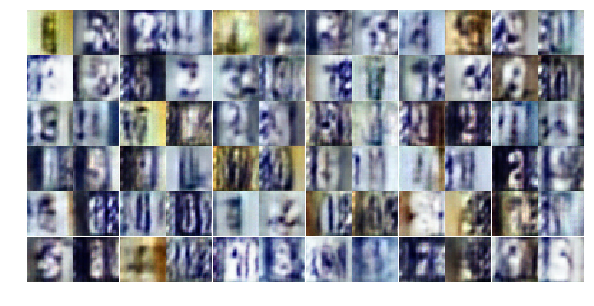

Epoch 3/5... Discriminator Loss: 0.6114... Generator Loss: 1.1340
Epoch 3/5... Discriminator Loss: 0.2386... Generator Loss: 2.1598
Epoch 3/5... Discriminator Loss: 0.6345... Generator Loss: 0.9889
Epoch 3/5... Discriminator Loss: 0.9966... Generator Loss: 0.7343
Epoch 3/5... Discriminator Loss: 0.5675... Generator Loss: 1.2720
Epoch 3/5... Discriminator Loss: 0.5970... Generator Loss: 1.1137
Epoch 3/5... Discriminator Loss: 0.4525... Generator Loss: 1.9917
Epoch 3/5... Discriminator Loss: 0.9382... Generator Loss: 2.2664
Epoch 3/5... Discriminator Loss: 0.6882... Generator Loss: 1.2360
Epoch 3/5... Discriminator Loss: 1.2044... Generator Loss: 0.5259


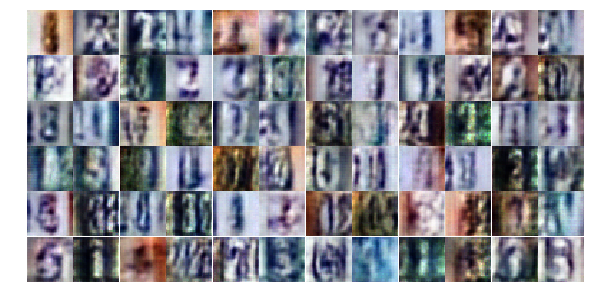

Epoch 3/5... Discriminator Loss: 0.6301... Generator Loss: 1.1213
Epoch 3/5... Discriminator Loss: 1.3700... Generator Loss: 0.4530
Epoch 3/5... Discriminator Loss: 0.4602... Generator Loss: 1.3459
Epoch 3/5... Discriminator Loss: 0.7025... Generator Loss: 0.9650
Epoch 3/5... Discriminator Loss: 0.7179... Generator Loss: 1.3015
Epoch 3/5... Discriminator Loss: 1.0457... Generator Loss: 0.6272
Epoch 3/5... Discriminator Loss: 0.3692... Generator Loss: 2.1586
Epoch 3/5... Discriminator Loss: 1.0355... Generator Loss: 0.5950
Epoch 3/5... Discriminator Loss: 0.4412... Generator Loss: 1.2611
Epoch 3/5... Discriminator Loss: 0.5434... Generator Loss: 1.2992


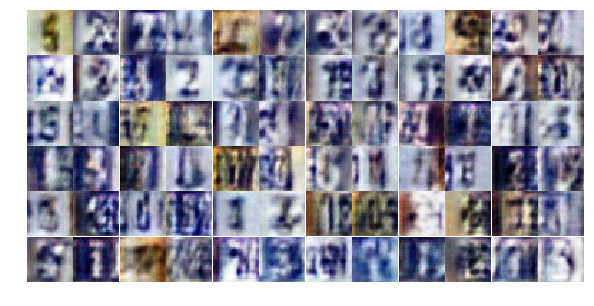

Epoch 3/5... Discriminator Loss: 0.3409... Generator Loss: 2.1862
Epoch 3/5... Discriminator Loss: 0.4106... Generator Loss: 2.0935
Epoch 3/5... Discriminator Loss: 0.7017... Generator Loss: 0.9856
Epoch 3/5... Discriminator Loss: 0.6709... Generator Loss: 1.1392
Epoch 3/5... Discriminator Loss: 0.3535... Generator Loss: 1.8445
Epoch 3/5... Discriminator Loss: 1.6548... Generator Loss: 0.3037
Epoch 3/5... Discriminator Loss: 0.7728... Generator Loss: 1.1307
Epoch 3/5... Discriminator Loss: 1.5578... Generator Loss: 0.3262
Epoch 3/5... Discriminator Loss: 0.9398... Generator Loss: 0.6878
Epoch 3/5... Discriminator Loss: 0.7112... Generator Loss: 1.1065


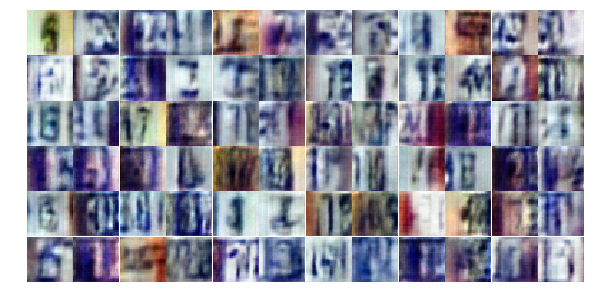

Epoch 3/5... Discriminator Loss: 0.6005... Generator Loss: 1.9848
Epoch 3/5... Discriminator Loss: 0.8002... Generator Loss: 0.8783
Epoch 3/5... Discriminator Loss: 0.5038... Generator Loss: 1.2069
Epoch 3/5... Discriminator Loss: 0.7725... Generator Loss: 0.8524
Epoch 3/5... Discriminator Loss: 0.4216... Generator Loss: 1.9054
Epoch 3/5... Discriminator Loss: 0.3511... Generator Loss: 2.1446
Epoch 3/5... Discriminator Loss: 0.6908... Generator Loss: 1.1845
Epoch 3/5... Discriminator Loss: 0.6468... Generator Loss: 1.1527
Epoch 3/5... Discriminator Loss: 1.1030... Generator Loss: 0.6987
Epoch 3/5... Discriminator Loss: 0.8044... Generator Loss: 2.6609


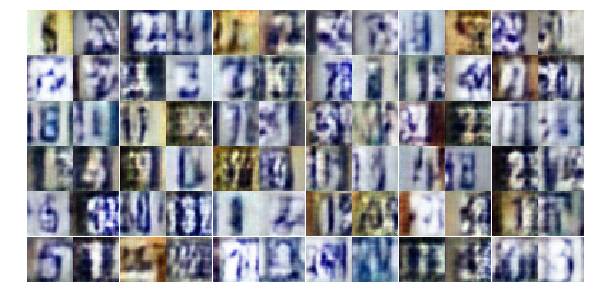

Epoch 3/5... Discriminator Loss: 0.3886... Generator Loss: 1.8606
Epoch 3/5... Discriminator Loss: 0.4916... Generator Loss: 1.8513
Epoch 3/5... Discriminator Loss: 0.2872... Generator Loss: 2.0701
Epoch 3/5... Discriminator Loss: 0.3840... Generator Loss: 2.5061
Epoch 3/5... Discriminator Loss: 0.6132... Generator Loss: 1.2463
Epoch 3/5... Discriminator Loss: 1.0916... Generator Loss: 0.5985
Epoch 3/5... Discriminator Loss: 0.5107... Generator Loss: 1.4618
Epoch 3/5... Discriminator Loss: 0.7901... Generator Loss: 0.8645
Epoch 3/5... Discriminator Loss: 0.4855... Generator Loss: 1.3157
Epoch 3/5... Discriminator Loss: 0.4439... Generator Loss: 1.4011


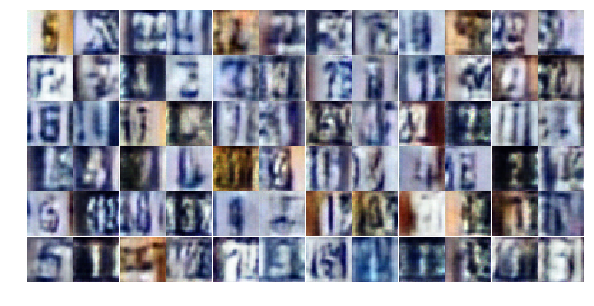

Epoch 3/5... Discriminator Loss: 1.0670... Generator Loss: 0.6014
Epoch 3/5... Discriminator Loss: 0.5584... Generator Loss: 1.1966
Epoch 3/5... Discriminator Loss: 1.1344... Generator Loss: 0.5112
Epoch 4/5... Discriminator Loss: 0.4801... Generator Loss: 2.1010
Epoch 4/5... Discriminator Loss: 0.4906... Generator Loss: 1.3551
Epoch 4/5... Discriminator Loss: 0.4886... Generator Loss: 1.2533
Epoch 4/5... Discriminator Loss: 0.4525... Generator Loss: 1.5665
Epoch 4/5... Discriminator Loss: 0.4380... Generator Loss: 1.7753
Epoch 4/5... Discriminator Loss: 1.0347... Generator Loss: 0.6968
Epoch 4/5... Discriminator Loss: 1.0472... Generator Loss: 0.5803


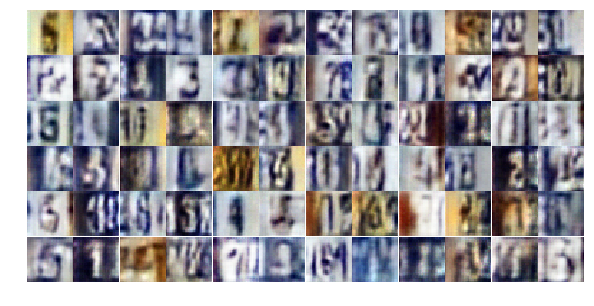

Epoch 4/5... Discriminator Loss: 0.8752... Generator Loss: 2.0589
Epoch 4/5... Discriminator Loss: 0.9811... Generator Loss: 0.7053
Epoch 4/5... Discriminator Loss: 0.4696... Generator Loss: 1.3116
Epoch 4/5... Discriminator Loss: 0.9658... Generator Loss: 0.6448
Epoch 4/5... Discriminator Loss: 0.3554... Generator Loss: 1.8648
Epoch 4/5... Discriminator Loss: 0.7838... Generator Loss: 0.8498
Epoch 4/5... Discriminator Loss: 0.9186... Generator Loss: 1.1772
Epoch 4/5... Discriminator Loss: 0.7107... Generator Loss: 1.0511
Epoch 4/5... Discriminator Loss: 0.7489... Generator Loss: 0.9285
Epoch 4/5... Discriminator Loss: 0.5161... Generator Loss: 1.2533


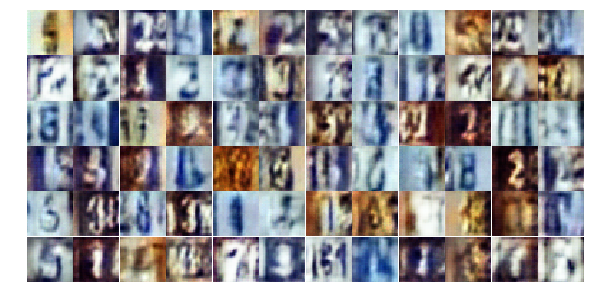

Epoch 4/5... Discriminator Loss: 0.4506... Generator Loss: 1.6317
Epoch 4/5... Discriminator Loss: 0.8369... Generator Loss: 1.0064
Epoch 4/5... Discriminator Loss: 0.7064... Generator Loss: 1.3622
Epoch 4/5... Discriminator Loss: 0.9846... Generator Loss: 0.6441
Epoch 4/5... Discriminator Loss: 1.1520... Generator Loss: 0.5466
Epoch 4/5... Discriminator Loss: 0.4084... Generator Loss: 1.5282
Epoch 4/5... Discriminator Loss: 0.9972... Generator Loss: 0.6584
Epoch 4/5... Discriminator Loss: 0.8468... Generator Loss: 1.1115
Epoch 4/5... Discriminator Loss: 0.5668... Generator Loss: 1.2864
Epoch 4/5... Discriminator Loss: 0.8449... Generator Loss: 0.7744


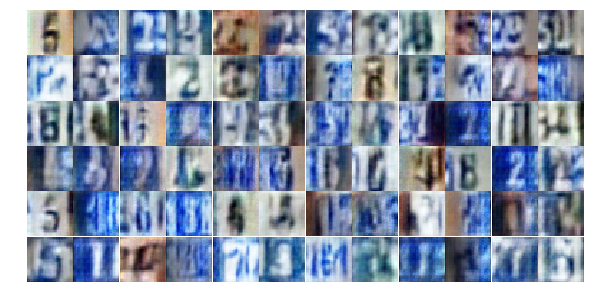

Epoch 4/5... Discriminator Loss: 1.3275... Generator Loss: 0.4368
Epoch 4/5... Discriminator Loss: 1.2329... Generator Loss: 0.6262
Epoch 4/5... Discriminator Loss: 0.6980... Generator Loss: 1.3035
Epoch 4/5... Discriminator Loss: 0.7047... Generator Loss: 1.7009
Epoch 4/5... Discriminator Loss: 0.9918... Generator Loss: 1.2474
Epoch 4/5... Discriminator Loss: 0.6779... Generator Loss: 1.4860
Epoch 4/5... Discriminator Loss: 0.8227... Generator Loss: 0.7750
Epoch 4/5... Discriminator Loss: 0.3721... Generator Loss: 1.5773
Epoch 4/5... Discriminator Loss: 0.5124... Generator Loss: 1.2656
Epoch 4/5... Discriminator Loss: 0.7097... Generator Loss: 0.8728


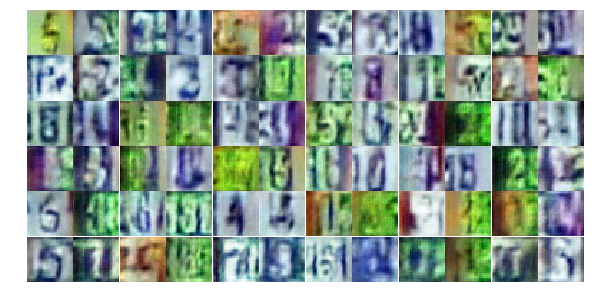

Epoch 4/5... Discriminator Loss: 1.0574... Generator Loss: 0.6098
Epoch 4/5... Discriminator Loss: 0.6794... Generator Loss: 1.2896
Epoch 4/5... Discriminator Loss: 0.4747... Generator Loss: 1.3977
Epoch 4/5... Discriminator Loss: 1.0593... Generator Loss: 0.5894
Epoch 4/5... Discriminator Loss: 0.9890... Generator Loss: 0.6161
Epoch 4/5... Discriminator Loss: 1.0488... Generator Loss: 0.5493
Epoch 4/5... Discriminator Loss: 0.9266... Generator Loss: 0.7214
Epoch 4/5... Discriminator Loss: 1.6687... Generator Loss: 0.3016
Epoch 4/5... Discriminator Loss: 1.7402... Generator Loss: 0.2891
Epoch 4/5... Discriminator Loss: 0.5434... Generator Loss: 1.6186


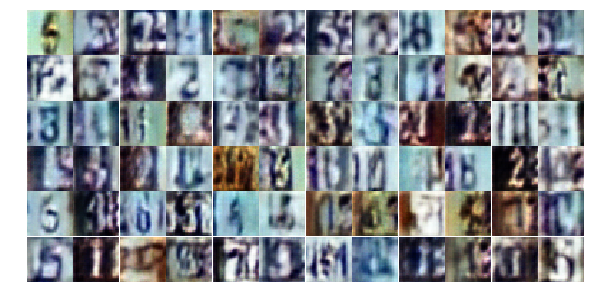

Epoch 4/5... Discriminator Loss: 0.7970... Generator Loss: 0.8049
Epoch 4/5... Discriminator Loss: 0.4403... Generator Loss: 1.8868
Epoch 4/5... Discriminator Loss: 1.0313... Generator Loss: 0.6707
Epoch 4/5... Discriminator Loss: 0.6313... Generator Loss: 1.0151
Epoch 4/5... Discriminator Loss: 0.7011... Generator Loss: 1.0642
Epoch 4/5... Discriminator Loss: 0.6565... Generator Loss: 1.1424
Epoch 4/5... Discriminator Loss: 0.4640... Generator Loss: 1.5298
Epoch 4/5... Discriminator Loss: 0.5484... Generator Loss: 1.3110
Epoch 4/5... Discriminator Loss: 1.2158... Generator Loss: 0.4539
Epoch 4/5... Discriminator Loss: 0.6000... Generator Loss: 2.1557


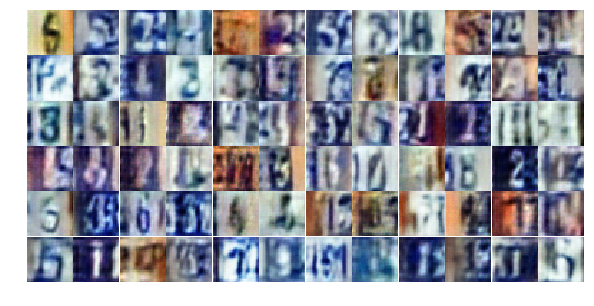

Epoch 4/5... Discriminator Loss: 0.3654... Generator Loss: 1.5627
Epoch 4/5... Discriminator Loss: 0.9955... Generator Loss: 0.6379
Epoch 4/5... Discriminator Loss: 0.5599... Generator Loss: 1.1893
Epoch 4/5... Discriminator Loss: 0.3576... Generator Loss: 1.7543
Epoch 4/5... Discriminator Loss: 0.1873... Generator Loss: 2.6714
Epoch 4/5... Discriminator Loss: 0.5752... Generator Loss: 2.8861
Epoch 4/5... Discriminator Loss: 0.8779... Generator Loss: 2.4507
Epoch 4/5... Discriminator Loss: 0.8608... Generator Loss: 0.8703
Epoch 4/5... Discriminator Loss: 0.7285... Generator Loss: 1.1572
Epoch 4/5... Discriminator Loss: 0.6334... Generator Loss: 1.2536


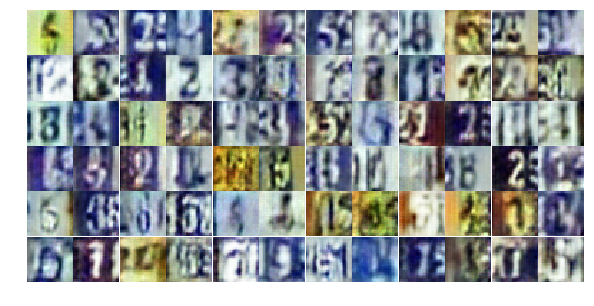

Epoch 4/5... Discriminator Loss: 0.6782... Generator Loss: 1.5511
Epoch 4/5... Discriminator Loss: 0.8163... Generator Loss: 1.0719
Epoch 4/5... Discriminator Loss: 0.5541... Generator Loss: 1.3007
Epoch 4/5... Discriminator Loss: 0.6890... Generator Loss: 1.9261
Epoch 4/5... Discriminator Loss: 0.7734... Generator Loss: 0.9688
Epoch 4/5... Discriminator Loss: 0.5842... Generator Loss: 1.1072
Epoch 4/5... Discriminator Loss: 0.7050... Generator Loss: 1.1207
Epoch 4/5... Discriminator Loss: 0.6256... Generator Loss: 1.2011
Epoch 4/5... Discriminator Loss: 0.5022... Generator Loss: 1.2878
Epoch 4/5... Discriminator Loss: 0.6136... Generator Loss: 1.1139


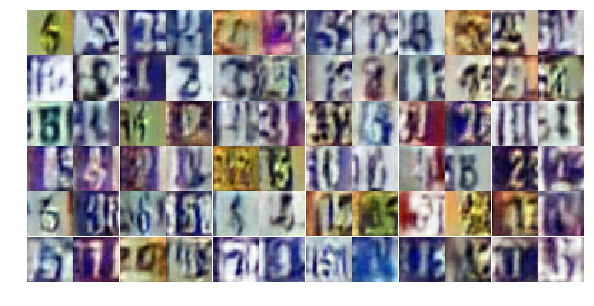

Epoch 4/5... Discriminator Loss: 1.0212... Generator Loss: 0.6096
Epoch 4/5... Discriminator Loss: 0.5376... Generator Loss: 2.4447
Epoch 4/5... Discriminator Loss: 0.5930... Generator Loss: 1.5742
Epoch 4/5... Discriminator Loss: 1.1217... Generator Loss: 0.5094
Epoch 4/5... Discriminator Loss: 0.8690... Generator Loss: 0.7333
Epoch 4/5... Discriminator Loss: 0.6701... Generator Loss: 1.1507
Epoch 4/5... Discriminator Loss: 0.6230... Generator Loss: 1.0387
Epoch 4/5... Discriminator Loss: 1.0302... Generator Loss: 0.6402
Epoch 4/5... Discriminator Loss: 0.4136... Generator Loss: 1.8920
Epoch 4/5... Discriminator Loss: 0.4072... Generator Loss: 1.5767


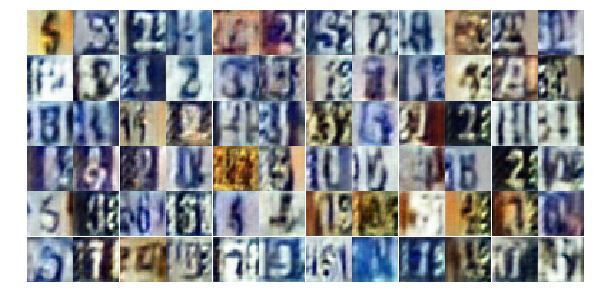

Epoch 4/5... Discriminator Loss: 0.8201... Generator Loss: 0.8045
Epoch 4/5... Discriminator Loss: 0.6133... Generator Loss: 1.4490
Epoch 4/5... Discriminator Loss: 0.4623... Generator Loss: 1.9932
Epoch 4/5... Discriminator Loss: 2.2473... Generator Loss: 0.1901
Epoch 4/5... Discriminator Loss: 0.8234... Generator Loss: 0.9795
Epoch 4/5... Discriminator Loss: 1.0587... Generator Loss: 0.6417
Epoch 4/5... Discriminator Loss: 0.8897... Generator Loss: 0.7721
Epoch 4/5... Discriminator Loss: 1.2072... Generator Loss: 0.4945
Epoch 4/5... Discriminator Loss: 0.7535... Generator Loss: 1.0170
Epoch 4/5... Discriminator Loss: 0.9425... Generator Loss: 0.6611


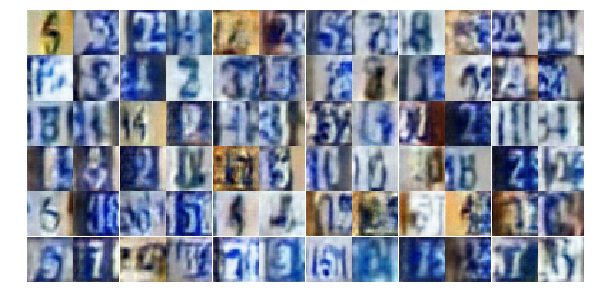

Epoch 4/5... Discriminator Loss: 0.7649... Generator Loss: 1.1189
Epoch 4/5... Discriminator Loss: 0.7113... Generator Loss: 1.3225
Epoch 4/5... Discriminator Loss: 0.7427... Generator Loss: 0.9172
Epoch 4/5... Discriminator Loss: 0.5362... Generator Loss: 1.4678
Epoch 4/5... Discriminator Loss: 0.3850... Generator Loss: 1.7386
Epoch 4/5... Discriminator Loss: 0.8833... Generator Loss: 0.7779
Epoch 4/5... Discriminator Loss: 0.3833... Generator Loss: 1.9529
Epoch 4/5... Discriminator Loss: 0.6224... Generator Loss: 1.2657
Epoch 4/5... Discriminator Loss: 0.6285... Generator Loss: 1.8639
Epoch 4/5... Discriminator Loss: 0.5734... Generator Loss: 1.6726


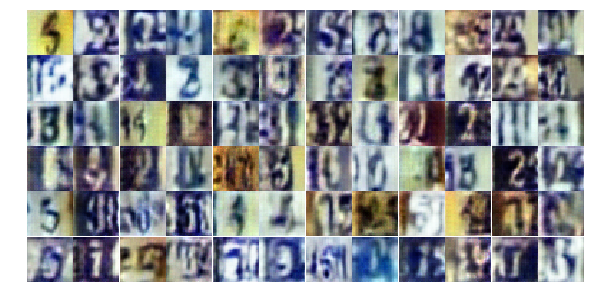

Epoch 4/5... Discriminator Loss: 0.5798... Generator Loss: 1.4640
Epoch 4/5... Discriminator Loss: 0.5103... Generator Loss: 1.6631
Epoch 4/5... Discriminator Loss: 1.1337... Generator Loss: 0.6036
Epoch 4/5... Discriminator Loss: 0.8304... Generator Loss: 0.8406
Epoch 4/5... Discriminator Loss: 0.5987... Generator Loss: 1.2841
Epoch 4/5... Discriminator Loss: 1.0017... Generator Loss: 0.6381
Epoch 4/5... Discriminator Loss: 1.1027... Generator Loss: 0.5332
Epoch 4/5... Discriminator Loss: 0.6281... Generator Loss: 1.0970
Epoch 5/5... Discriminator Loss: 0.7687... Generator Loss: 1.0174
Epoch 5/5... Discriminator Loss: 0.6976... Generator Loss: 1.0906


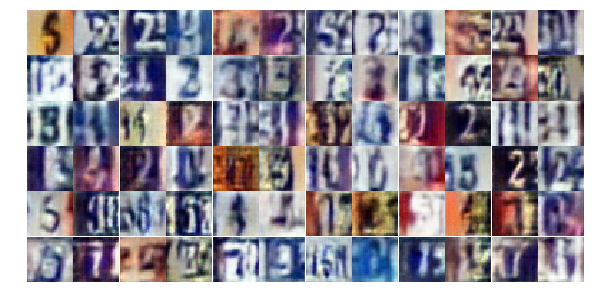

Epoch 5/5... Discriminator Loss: 0.5354... Generator Loss: 1.3436
Epoch 5/5... Discriminator Loss: 0.5753... Generator Loss: 1.1820
Epoch 5/5... Discriminator Loss: 0.5322... Generator Loss: 1.5777
Epoch 5/5... Discriminator Loss: 0.6790... Generator Loss: 1.8782
Epoch 5/5... Discriminator Loss: 0.6871... Generator Loss: 1.0440
Epoch 5/5... Discriminator Loss: 0.6333... Generator Loss: 1.1474
Epoch 5/5... Discriminator Loss: 0.5316... Generator Loss: 1.2530
Epoch 5/5... Discriminator Loss: 0.8448... Generator Loss: 0.8287
Epoch 5/5... Discriminator Loss: 0.7643... Generator Loss: 0.8394
Epoch 5/5... Discriminator Loss: 1.3360... Generator Loss: 2.0706


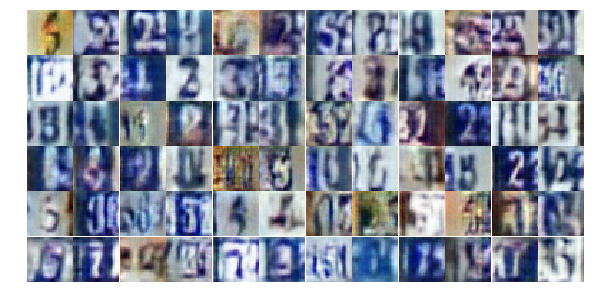

Epoch 5/5... Discriminator Loss: 0.5570... Generator Loss: 1.2201
Epoch 5/5... Discriminator Loss: 0.3635... Generator Loss: 1.8297
Epoch 5/5... Discriminator Loss: 1.2440... Generator Loss: 0.4297
Epoch 5/5... Discriminator Loss: 0.3794... Generator Loss: 1.6658
Epoch 5/5... Discriminator Loss: 0.5700... Generator Loss: 1.1637
Epoch 5/5... Discriminator Loss: 1.0285... Generator Loss: 0.7387
Epoch 5/5... Discriminator Loss: 0.6889... Generator Loss: 0.9385
Epoch 5/5... Discriminator Loss: 0.4361... Generator Loss: 1.4580
Epoch 5/5... Discriminator Loss: 0.3052... Generator Loss: 1.6999
Epoch 5/5... Discriminator Loss: 0.5423... Generator Loss: 1.4301


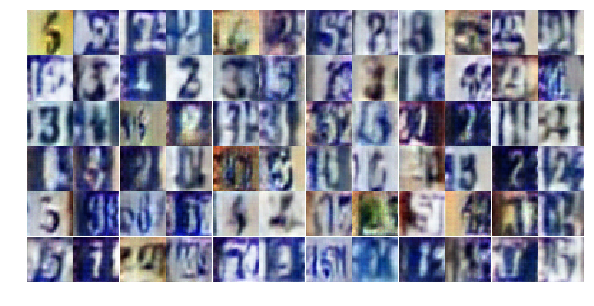

Epoch 5/5... Discriminator Loss: 0.6135... Generator Loss: 1.1161
Epoch 5/5... Discriminator Loss: 0.5171... Generator Loss: 1.6339
Epoch 5/5... Discriminator Loss: 0.7348... Generator Loss: 0.8435
Epoch 5/5... Discriminator Loss: 0.5655... Generator Loss: 1.2211
Epoch 5/5... Discriminator Loss: 1.2680... Generator Loss: 0.4687
Epoch 5/5... Discriminator Loss: 0.8745... Generator Loss: 0.7954
Epoch 5/5... Discriminator Loss: 1.2028... Generator Loss: 0.5991
Epoch 5/5... Discriminator Loss: 0.5652... Generator Loss: 1.1789
Epoch 5/5... Discriminator Loss: 1.0070... Generator Loss: 0.6951
Epoch 5/5... Discriminator Loss: 0.8829... Generator Loss: 0.7734


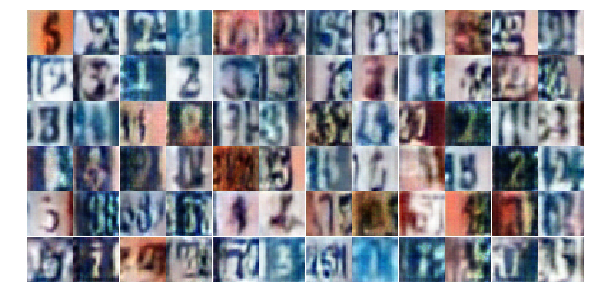

Epoch 5/5... Discriminator Loss: 0.6908... Generator Loss: 2.1466
Epoch 5/5... Discriminator Loss: 0.9084... Generator Loss: 1.3910
Epoch 5/5... Discriminator Loss: 0.9840... Generator Loss: 0.6855
Epoch 5/5... Discriminator Loss: 0.7084... Generator Loss: 1.0317
Epoch 5/5... Discriminator Loss: 0.5593... Generator Loss: 1.2246
Epoch 5/5... Discriminator Loss: 0.6699... Generator Loss: 0.9915
Epoch 5/5... Discriminator Loss: 0.4276... Generator Loss: 1.6163
Epoch 5/5... Discriminator Loss: 0.4546... Generator Loss: 1.5261
Epoch 5/5... Discriminator Loss: 0.9575... Generator Loss: 0.5876
Epoch 5/5... Discriminator Loss: 0.4477... Generator Loss: 1.6967


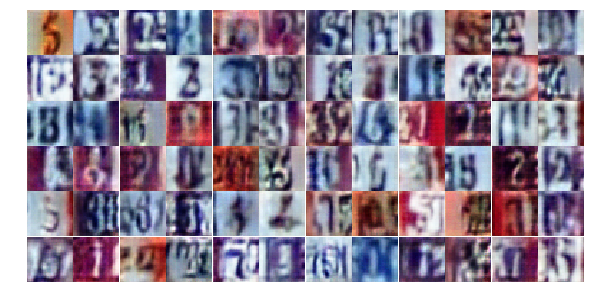

Epoch 5/5... Discriminator Loss: 0.4441... Generator Loss: 1.4148
Epoch 5/5... Discriminator Loss: 0.4434... Generator Loss: 1.4075
Epoch 5/5... Discriminator Loss: 0.7305... Generator Loss: 0.9466
Epoch 5/5... Discriminator Loss: 0.3586... Generator Loss: 1.9954
Epoch 5/5... Discriminator Loss: 1.0161... Generator Loss: 0.6482
Epoch 5/5... Discriminator Loss: 0.8237... Generator Loss: 0.7979
Epoch 5/5... Discriminator Loss: 0.6331... Generator Loss: 1.1403
Epoch 5/5... Discriminator Loss: 0.7056... Generator Loss: 2.6375
Epoch 5/5... Discriminator Loss: 0.5656... Generator Loss: 1.1824
Epoch 5/5... Discriminator Loss: 0.4094... Generator Loss: 1.9037


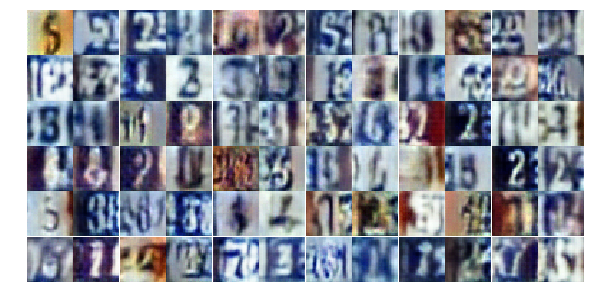

Epoch 5/5... Discriminator Loss: 1.0684... Generator Loss: 0.6548
Epoch 5/5... Discriminator Loss: 0.4641... Generator Loss: 1.4373
Epoch 5/5... Discriminator Loss: 0.3427... Generator Loss: 1.6729
Epoch 5/5... Discriminator Loss: 0.5176... Generator Loss: 2.4755
Epoch 5/5... Discriminator Loss: 0.5418... Generator Loss: 1.2408
Epoch 5/5... Discriminator Loss: 0.7516... Generator Loss: 2.0372
Epoch 5/5... Discriminator Loss: 1.2243... Generator Loss: 1.9233
Epoch 5/5... Discriminator Loss: 0.5451... Generator Loss: 1.5835
Epoch 5/5... Discriminator Loss: 0.5498... Generator Loss: 1.5049
Epoch 5/5... Discriminator Loss: 0.4583... Generator Loss: 2.6535


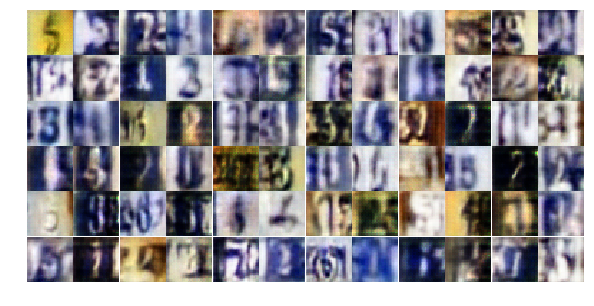

Epoch 5/5... Discriminator Loss: 0.8223... Generator Loss: 0.8689
Epoch 5/5... Discriminator Loss: 0.7124... Generator Loss: 1.1697
Epoch 5/5... Discriminator Loss: 0.8256... Generator Loss: 0.8755
Epoch 5/5... Discriminator Loss: 0.7580... Generator Loss: 1.3800
Epoch 5/5... Discriminator Loss: 0.9800... Generator Loss: 0.6400
Epoch 5/5... Discriminator Loss: 0.6639... Generator Loss: 1.4581
Epoch 5/5... Discriminator Loss: 0.6460... Generator Loss: 1.6522
Epoch 5/5... Discriminator Loss: 0.7059... Generator Loss: 1.0514
Epoch 5/5... Discriminator Loss: 1.6926... Generator Loss: 0.3228
Epoch 5/5... Discriminator Loss: 0.7843... Generator Loss: 0.9628


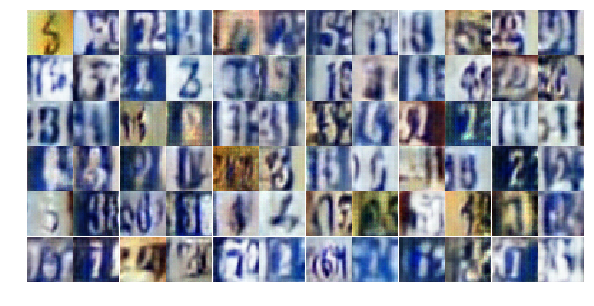

Epoch 5/5... Discriminator Loss: 1.3285... Generator Loss: 0.4780
Epoch 5/5... Discriminator Loss: 0.4811... Generator Loss: 1.4515
Epoch 5/5... Discriminator Loss: 0.6089... Generator Loss: 1.1559
Epoch 5/5... Discriminator Loss: 0.5981... Generator Loss: 1.1534
Epoch 5/5... Discriminator Loss: 1.2631... Generator Loss: 0.4334
Epoch 5/5... Discriminator Loss: 0.5204... Generator Loss: 1.8836
Epoch 5/5... Discriminator Loss: 0.9960... Generator Loss: 0.6687
Epoch 5/5... Discriminator Loss: 0.7476... Generator Loss: 0.8964
Epoch 5/5... Discriminator Loss: 0.2789... Generator Loss: 2.0543
Epoch 5/5... Discriminator Loss: 0.4743... Generator Loss: 1.3499


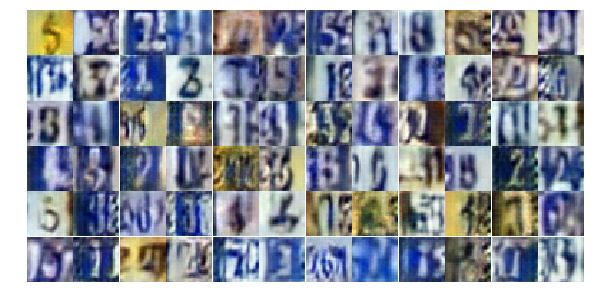

Epoch 5/5... Discriminator Loss: 0.3962... Generator Loss: 1.6103
Epoch 5/5... Discriminator Loss: 0.4987... Generator Loss: 1.2492
Epoch 5/5... Discriminator Loss: 0.7563... Generator Loss: 0.9889
Epoch 5/5... Discriminator Loss: 0.3307... Generator Loss: 2.3397
Epoch 5/5... Discriminator Loss: 1.6462... Generator Loss: 0.3056
Epoch 5/5... Discriminator Loss: 0.3660... Generator Loss: 1.8799
Epoch 5/5... Discriminator Loss: 1.6740... Generator Loss: 0.2830
Epoch 5/5... Discriminator Loss: 0.6167... Generator Loss: 1.2299
Epoch 5/5... Discriminator Loss: 1.5595... Generator Loss: 0.3091
Epoch 5/5... Discriminator Loss: 0.7368... Generator Loss: 1.0075


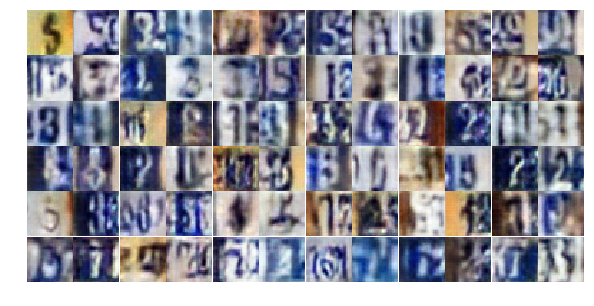

Epoch 5/5... Discriminator Loss: 0.9517... Generator Loss: 0.7220
Epoch 5/5... Discriminator Loss: 0.5276... Generator Loss: 1.2711
Epoch 5/5... Discriminator Loss: 0.4435... Generator Loss: 1.4940
Epoch 5/5... Discriminator Loss: 0.7916... Generator Loss: 0.8909
Epoch 5/5... Discriminator Loss: 0.5327... Generator Loss: 1.3224
Epoch 5/5... Discriminator Loss: 0.4147... Generator Loss: 1.6440
Epoch 5/5... Discriminator Loss: 0.4037... Generator Loss: 1.5975
Epoch 5/5... Discriminator Loss: 0.5821... Generator Loss: 1.1532
Epoch 5/5... Discriminator Loss: 0.6455... Generator Loss: 1.6492
Epoch 5/5... Discriminator Loss: 0.3805... Generator Loss: 2.0642


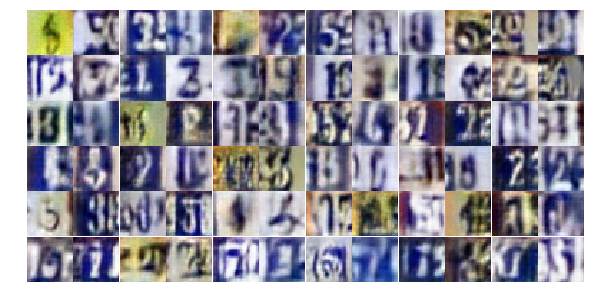

Epoch 5/5... Discriminator Loss: 1.0513... Generator Loss: 0.6892
Epoch 5/5... Discriminator Loss: 0.3949... Generator Loss: 1.9560
Epoch 5/5... Discriminator Loss: 0.5392... Generator Loss: 1.7675
Epoch 5/5... Discriminator Loss: 1.0010... Generator Loss: 0.6845
Epoch 5/5... Discriminator Loss: 1.3870... Generator Loss: 0.4218
Epoch 5/5... Discriminator Loss: 0.7469... Generator Loss: 1.2726
Epoch 5/5... Discriminator Loss: 0.5083... Generator Loss: 1.2990
Epoch 5/5... Discriminator Loss: 0.6685... Generator Loss: 1.1152
Epoch 5/5... Discriminator Loss: 0.8185... Generator Loss: 0.7633
Epoch 5/5... Discriminator Loss: 0.9882... Generator Loss: 0.6289


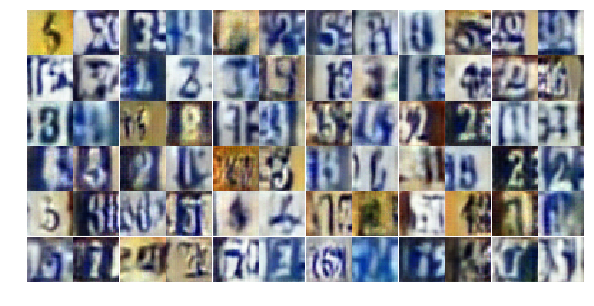

Epoch 5/5... Discriminator Loss: 0.8392... Generator Loss: 0.8089
Epoch 5/5... Discriminator Loss: 0.8643... Generator Loss: 1.3208


In [17]:
# Load the data and train the network here
dataset = Dataset(trainset, testset)
losses, samples = train(net, dataset, epochs, batch_size, figsize=(10,5))

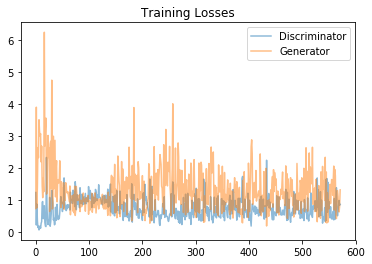

In [18]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

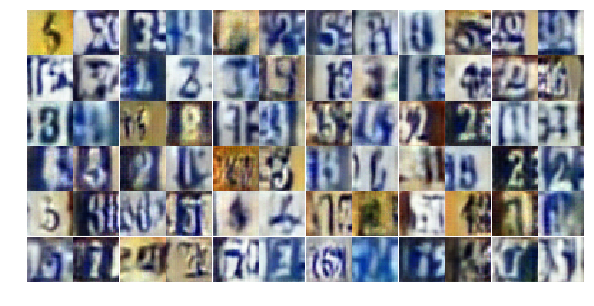

In [19]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))